# Human gastrulational development analysis

In [5]:
import scanpy as sc
import numpy as np
import os
import pandas as pd
import matplotlib.pyplot as plt
sc.settings.set_figure_params(dpi=150)

In [3]:
adata1=sc.read("./data/CCA_human_gastrula_pcw3.h5ad")
adata1_rna=sc.read("./data/CCA_human_gastrula_pcw3_assayRNA.h5ad")

/datb/home/wanglab13/anaconda3/lib/python3.7/site-packages/anndata/compat/__init__.py:182: FutureWarning: Moving element from .uns['neighbors']['distances'] to .obsp['distances'].

This is where adjacency matrices should go now.
  FutureWarning,


... storing 'cluster_id' as categorical
... storing 'cluster_id_v1' as categorical
... storing 'clusters_coarse' as categorical
... storing 'clusters_coarse_epi' as categorical
... storing 'clusters_coarse_epi_name' as categorical
... storing 'clusters_coarse_epi_nname' as categorical
... storing 'clusters_coarse_nonum' as categorical
... storing 'phase' as categorical
... storing 'sub_cluster' as categorical
... storing 'week_stage' as categorical


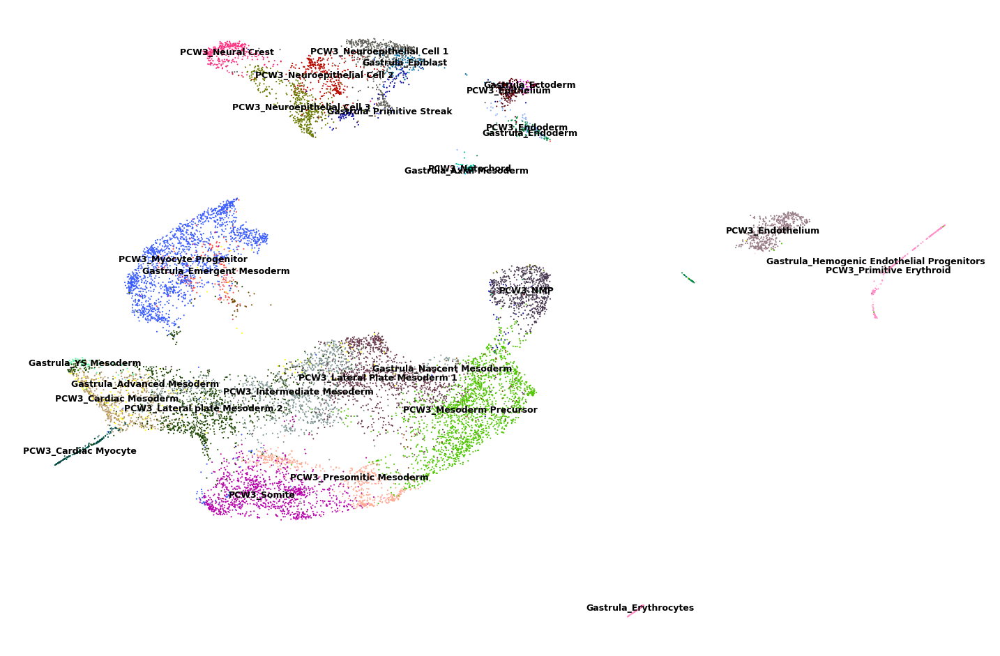

In [6]:
fig,ax=plt.subplots(figsize=(12,8))
sc.pl.umap(adata1,color='cluster_id_v1',legend_loc='on data',size=4,ax=ax,legend_fontsize=6,frameon=False,title='')

/datb/home/wanglab13/anaconda3/lib/python3.7/site-packages/numba/core/typed_passes.py:314: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see https://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../../datb/home/wanglab13/anaconda3/lib/python3.7/site-packages/umap/rp_tree.py", line 135:
@numba.njit(fastmath=True, nogil=True, parallel=True)
def euclidean_random_projection_split(data, indices, rng_state):
^

  state.func_ir.loc))
/datb/home/wanglab13/anaconda3/lib/python3.7/site-packages/umap/nndescent.py:92: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see https://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../.

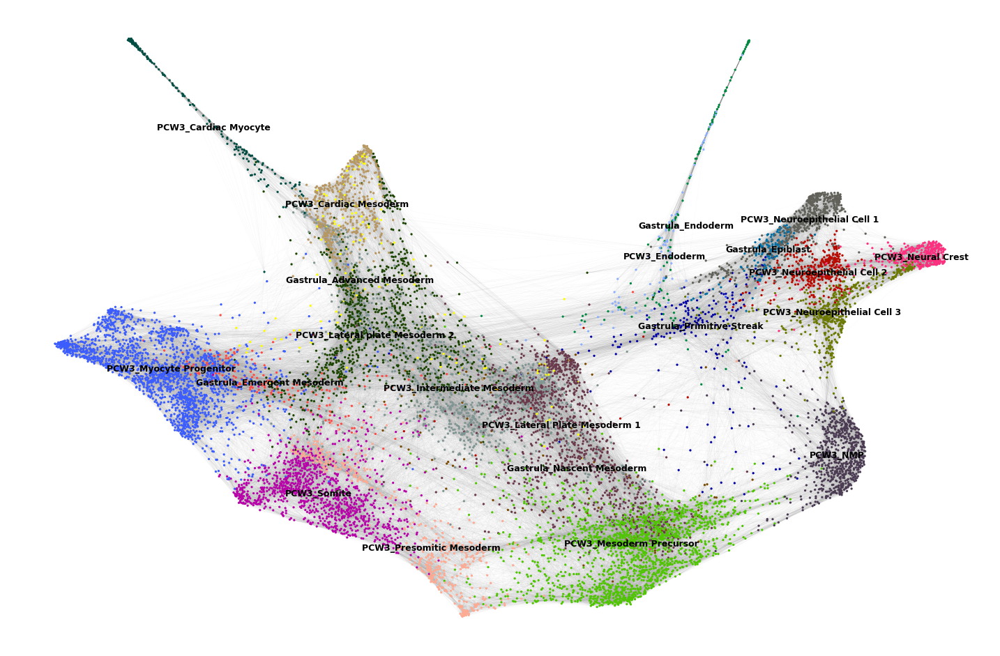

In [7]:
# only keep cell clusters belonging to the three germ layers
adata1_filter=adata1[~adata1.obs['cluster_id_v1'].isin(['Gastrula_Axial Mesoderm','Gastrula_Ectoderm', 'Gastrula_Erythrocytes',
       'Gastrula_Hemogenic Endothelial Progenitors','Gastrula_Hemogenic Endothelial Progenitors','Gastrula_YS Mesoderm','PCW3_Endothelium', 'PCW3_Epithelium',
                                                       'PCW3_Notochord','PCW3_Primitive Erythroid'])].copy()
sc.pp.neighbors(adata1_filter,n_neighbors=30)
sc.tl.draw_graph(adata1_filter)
fig,ax=plt.subplots(figsize=(12,8))
sc.pl.draw_graph(adata1_filter,color='cluster_id_v1',legend_loc='on data',ax=ax,legend_fontsize=6,frameon=False,title='',edges=True, edges_width=0.01)

... storing 'cluster_id_v3' as categorical


<AxesSubplot:xlabel='FA1', ylabel='FA2'>

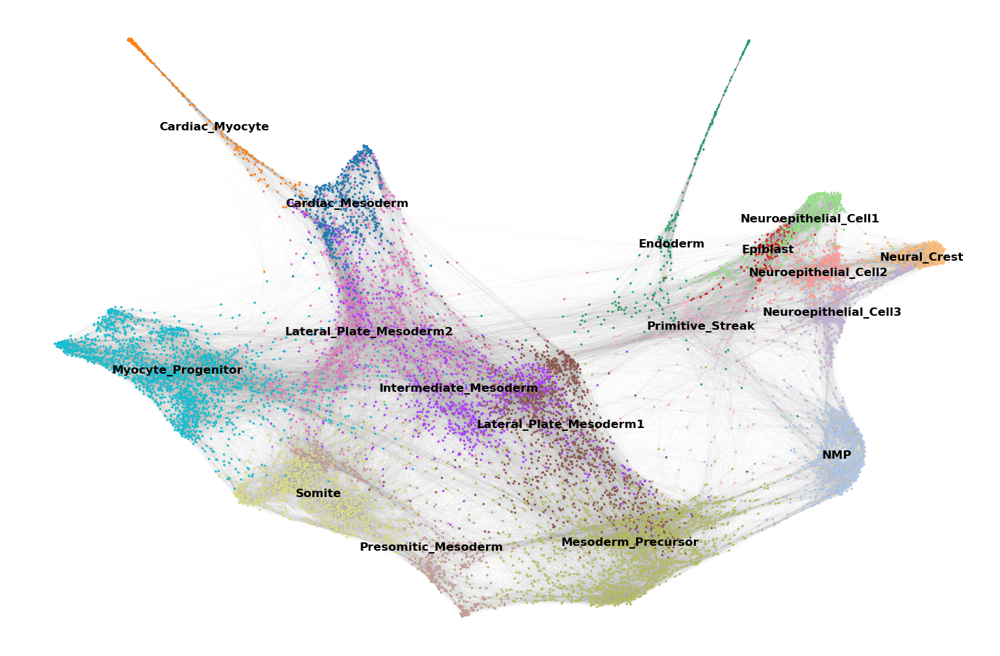

In [8]:
adata1_filter.obs['cluster_id_v2']=adata1_filter.obs['cluster_id_v1']
adata1_filter.rename_categories('cluster_id_v2', ['Gastrula_Lateral_Plate_Mesoderm2', 'Gastrula_Myocyte_Progenitor',
       'Gastrula_Endoderm', 'Gastrula_Epiblast', 'Gastrula_Mesoderm_Precursor',
       'Gastrula_Primitive_Streak', 'PCW3_Cardiac_Mesoderm',
       'PCW3_Cardiac_Myocyte', 'PCW3_Endoderm', 'PCW3_Intermediate_Mesoderm',
       'PCW3_Lateral_Plate_Mesoderm1', 'PCW3_Lateral_Plate_Mesoderm2',
       'PCW3_Mesoderm_Precursor', 'PCW3_Myocyte_Progenitor', 'PCW3_NMP',
       'PCW3_Neural_Crest', 'PCW3_Neuroepithelial_Cell1',
       'PCW3_Neuroepithelial_Cell2', 'PCW3_Neuroepithelial_Cell3',
       'PCW3_Presomitic_Mesoderm', 'PCW3_Somite'])
adata1_filter.obs['cluster_id_v3']=['_'.join(i.split('_')[1:]) for i in adata1_filter.obs['cluster_id_v2']]
fig,ax=plt.subplots(figsize=(12,8))
sc.pl.draw_graph(adata1_filter,color='cluster_id_v3',legend_loc='on data',ax=ax,legend_fontsize=8,frameon=False,title='',edges=True, edges_width=0.01,show=False)
# plt.savefig('./Paper_figures/human_gastrula_pcw3_draw_graph_cell_types.pdf',dpi=300, format='pdf')

/datb/home/wanglab13/anaconda3/lib/python3.7/site-packages/numba/core/typed_passes.py:314: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see https://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../../datb/home/wanglab13/anaconda3/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  state.func_ir.loc))


<AxesSubplot:xlabel='FA1', ylabel='FA2'>

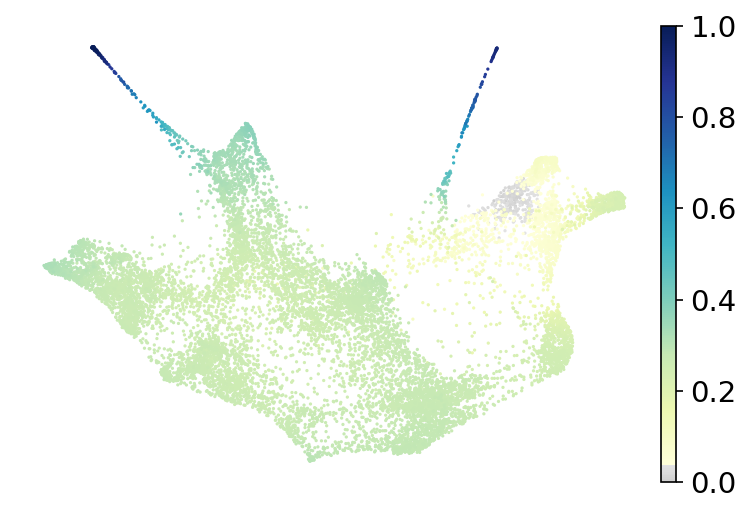

In [14]:
# Calculate dpt pseudotime, starting from the Epiblast cluster
sc.pp.neighbors(adata1_filter,method='gauss',n_neighbors=50,n_pcs=30)
adata1_filter.uns['iroot'] = np.flatnonzero(adata1_filter.obs['cluster_id_v3']  == 'Epiblast')[0]
sc.tl.diffmap(adata1_filter)
sc.tl.dpt(adata1_filter)
from matplotlib import colors
#Define a nice colour map for gene expression
colors1 = plt.cm.YlGnBu(np.linspace(0, 1, 512))
colors2 = plt.cm.Greys_r(np.linspace(0.7, 0.8, 20))
colorsComb = np.vstack([ colors2, colors1])
mymap = colors.LinearSegmentedColormap.from_list('my_colormap', colorsComb)
fig,ax=plt.subplots(figsize=(6,4))
sc.pl.draw_graph(adata1_filter,color='dpt_pseudotime', cmap=mymap,legend_loc=False,ax=ax,legend_fontsize=8,frameon=False,title='',show=False)
# plt.savefig('./Paper_figures/human_gastrula_pcw3_draw_graph_pseudotime.pdf',dpi=300, format='pdf')

<AxesSubplot:xlabel='FA1', ylabel='FA2'>

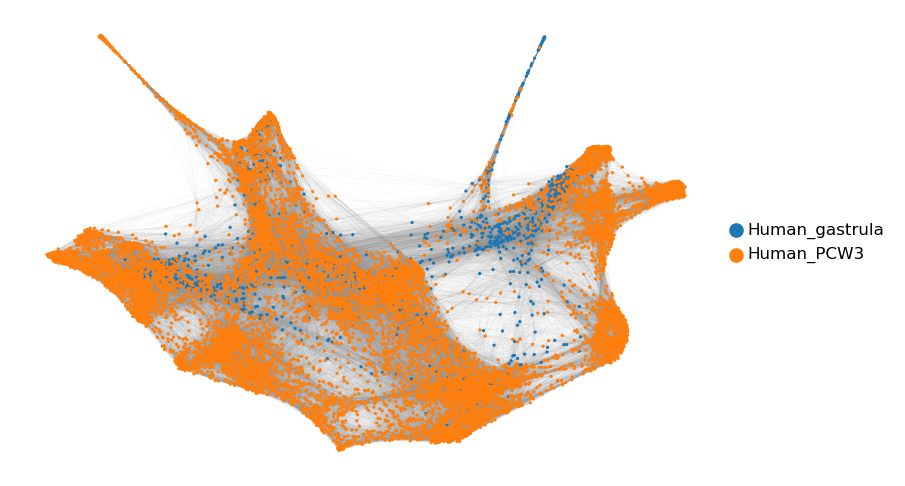

In [17]:
adata1_filter.obs['batch']=adata1_filter.obs['batch'].astype('category')
adata1_filter.rename_categories('batch', ['Human_gastrula','Human_PCW3'])
fig,ax=plt.subplots(figsize=(6,4))
sc.pl.draw_graph(adata1_filter,color='batch',legend_loc='right margin',ax=ax,legend_fontsize=8,frameon=False,title='',edges=True, edges_width=0.01,show=False)
# plt.savefig('./Paper_figures/human_gastrula_pcw3_draw_graph_sample_v1.pdf',dpi=300, format='pdf')

In [18]:
map_coarse = {}
for c in adata1_filter.obs['cluster_id_v1'].cat.categories:
    if c in ['Gastrula_Advanced Mesoderm','PCW3_Cardiac Mesoderm','PCW3_Cardiac Myocyte','PCW3_Lateral Plate Mesoderm 1','PCW3_Lateral plate Mesoderm 2']:
        map_coarse[c]='Lateral_plate_mesoderm'
    if c in ['Gastrula_Nascent Mesoderm','PCW3_Mesoderm Precursor','Gastrula_Emergent Mesoderm','PCW3_Presomitic Mesoderm','PCW3_Somite','PCW3_Myocyte Progenitor']:
        map_coarse[c]='Praxial_mesoderm'
    if c in ['Gastrula_Endoderm', 'PCW3_Endoderm']:
        map_coarse[c]='Endoderm'
    if c in ['PCW3_Neural Crest', 'PCW3_Neuroepithelial Cell 1',
       'PCW3_Neuroepithelial Cell 2', 'PCW3_Neuroepithelial Cell 3']:
        map_coarse[c]='Neural_ectoderm'
    if c in ['PCW3_Intermediate Mesoderm']:
        map_coarse[c]='Intermediate_mesoderm'
    if c in ['Gastrula_Primitive Streak']:
        map_coarse[c]='Primitive_streak'   
    if c in ['PCW3_NMP']:
        map_coarse[c]='NMP'    

adata1_filter.obs['clusters']=adata1_filter.obs['cluster_id_v1']
adata1_filter.obs.replace({'clusters':map_coarse},inplace=True)

... storing 'clusters' as categorical


<AxesSubplot:xlabel='FA1', ylabel='FA2'>

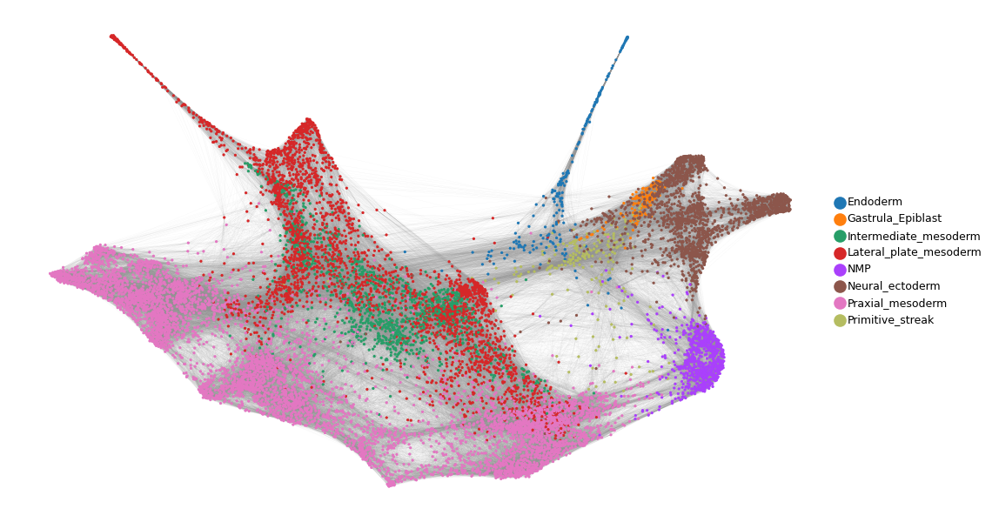

In [19]:
fig,ax=plt.subplots(figsize=(8,5))
sc.pl.draw_graph(adata1_filter,color='clusters',legend_loc='right margin',add_outline=False,ax=ax,legend_fontsize=6,frameon=False,title='',edges=True, edges_width=0.01,show=False)
# plt.savefig('./Paper_figures/human_gastrula_pcw3_draw_graph_v2.pdf',dpi=300, format='pdf')

In [20]:
adata1_filter_v1=sc.AnnData(X=adata1_rna[adata1_filter.obs_names,:].X,
                           obs=adata1_filter.obs,
                           var=adata1_rna[adata1_filter.obs_names,:].var,
                            uns=adata1_filter.uns,
                            obsm=adata1_filter.obsm,
                            obsp=adata1_filter.obsp
                           )

In [22]:
adata1_filter_v1.obs['clusters']=adata1_filter_v1.obs['clusters'].astype('category')
adata1_filter_v1.obs['clusters'].cat.reorder_categories(['Endoderm','Primitive_streak','Gastrula_Epiblast','Neural_ectoderm','Intermediate_mesoderm','Lateral_plate_mesoderm','NMP','Praxial_mesoderm'],inplace=True)

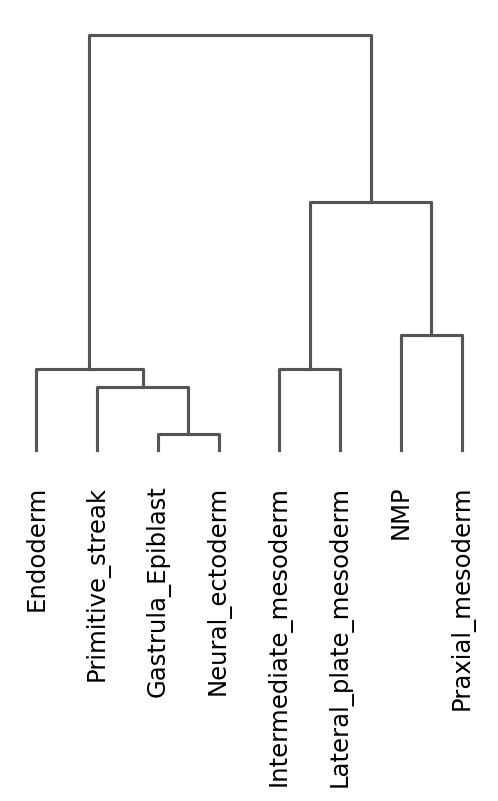

<AxesSubplot:>

In [25]:
sc.tl.dendrogram(adata1_filter_v1,groupby='clusters',n_pcs=5)
sc.pl.dendrogram(adata1_filter_v1,groupby='clusters')

{'mainplot_ax': <AxesSubplot:>,
 'group_extra_ax': <AxesSubplot:>,
 'size_legend_ax': <AxesSubplot:title={'center':'Fraction of cells\nin group (%)'}>,
 'color_legend_ax': <AxesSubplot:title={'center':'Mean expression\nin group'}>}

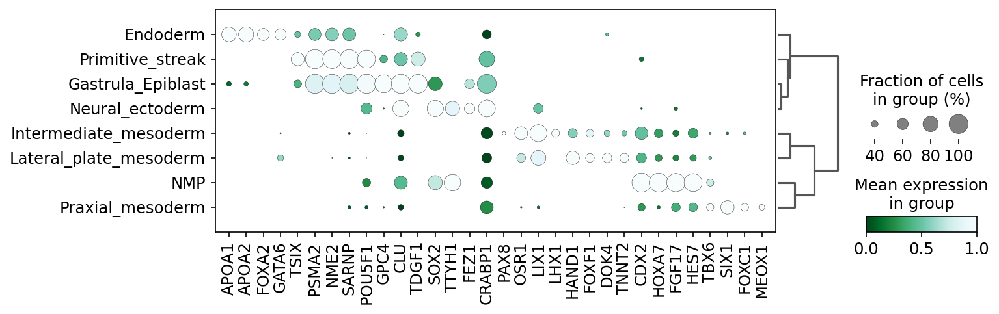

In [26]:
from matplotlib import colors
#Define a nice colour map for gene expression
colors2 = plt.cm.Oranges(np.linspace(0, 1, 256))
colors3 = plt.cm.Greys_r(np.linspace(0.7,0.8,20))
colorsComb = np.vstack([colors3, colors2])
mymap = colors.LinearSegmentedColormap.from_list('my_colormap', colorsComb)
Endoderm=['APOA1','APOA2','FOXA2','GATA6']
Gastrula_Epiblast=['POU5F1','GPC4','CLU','TDGF1']
Intermediate_mesoderm=['PAX8','OSR1','LIX1','LHX1']
Lateral_plate_mesoderm=['HAND1','FOXF1','DOK4','TNNT2']
NMP=['CDX2','HOXA7','FGF17','HES7']
Neural_ectoderm=['SOX2','TTYH1','FEZ1','CRABP1']
Praxial_mesoderm=['TBX6','SIX1', 'FOXC1', 'MEOX1']
Primitive_streak=['TSIX','PSMA2','NME2','SARNP']
marker_all=Endoderm+Primitive_streak+Gastrula_Epiblast+Neural_ectoderm+Intermediate_mesoderm+Lateral_plate_mesoderm+NMP+Praxial_mesoderm
fig,ax=plt.subplots(figsize=(10,3))
sc.pl.dotplot(adata1_filter_v1, marker_all,log=False,  groupby='clusters', dendrogram=True,standard_scale='var',cmap='BuGn_r', linewidths=0,use_raw=False,dot_min=0.2,figsize=(10,4),ax=ax,show=False)
# plt.savefig('./Paper_figures/human_gastrula_pcw3_dotplot_v1.pdf',dpi=300, format='pdf')

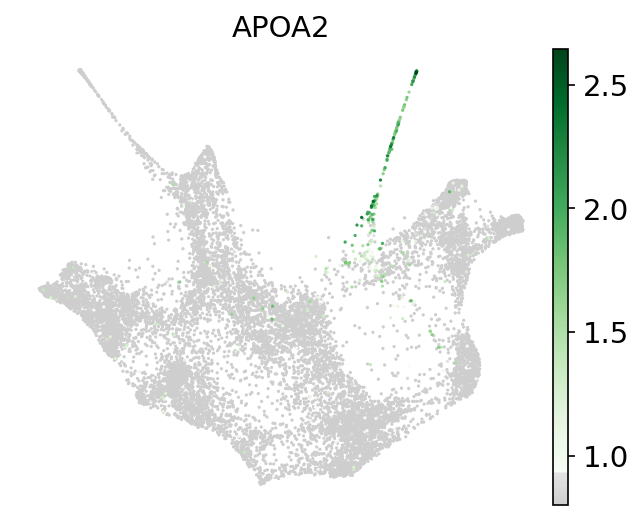

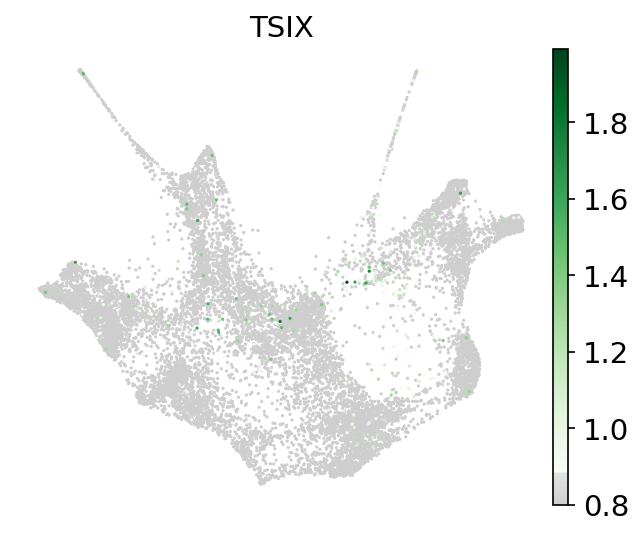

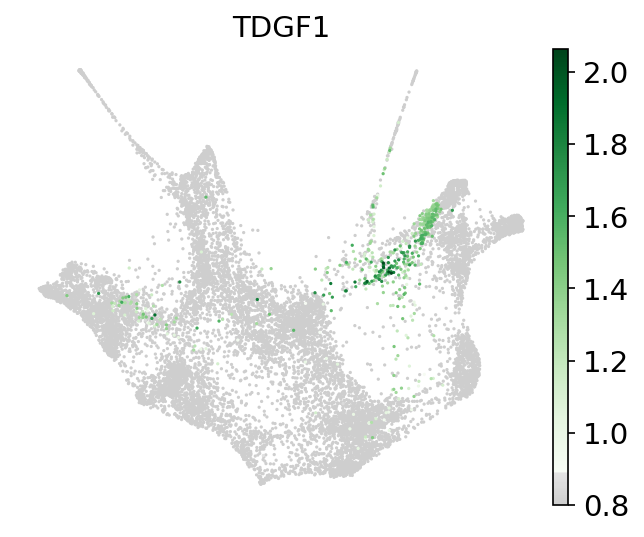

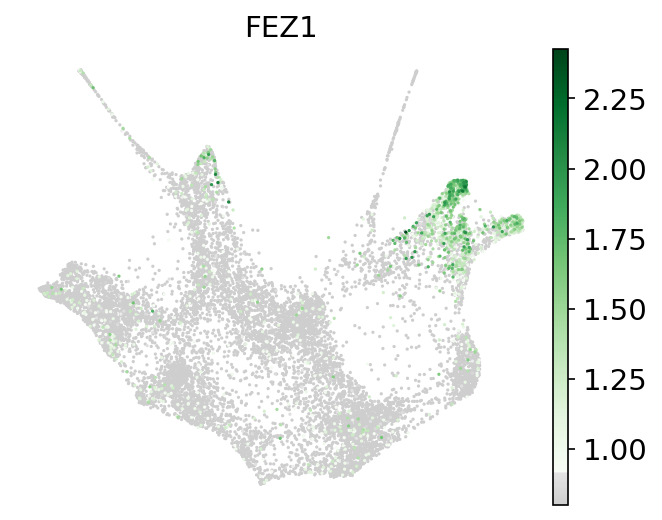

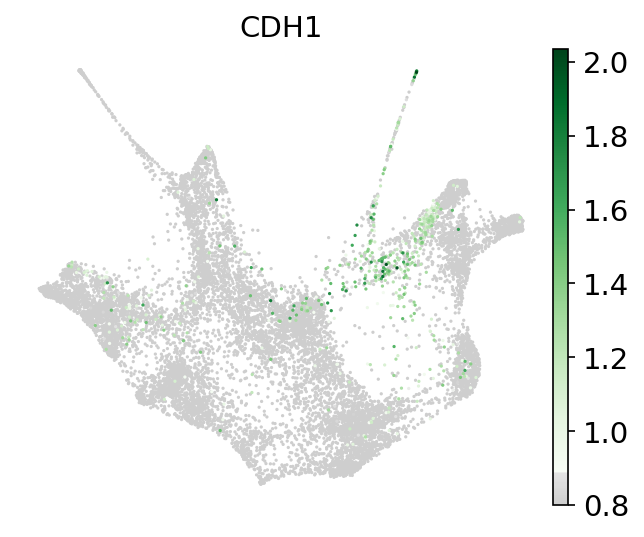

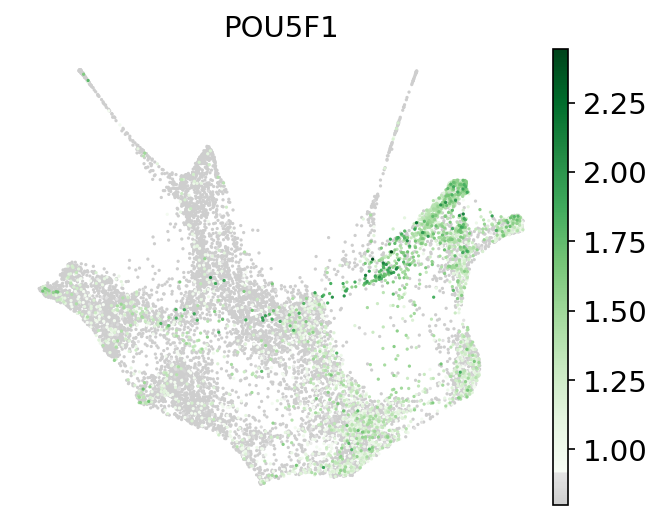

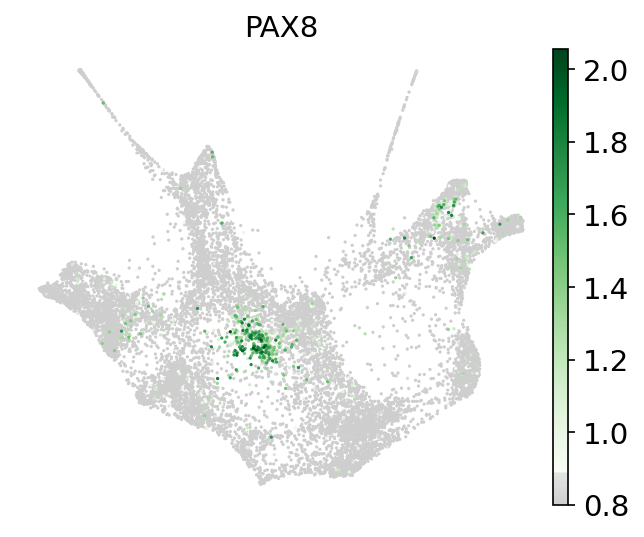

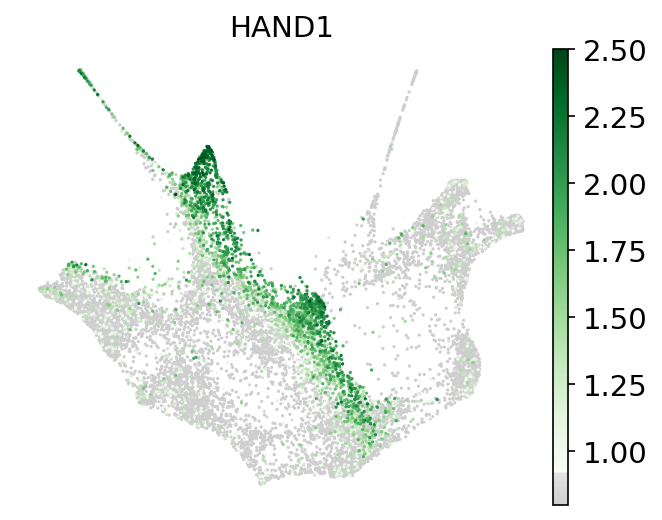

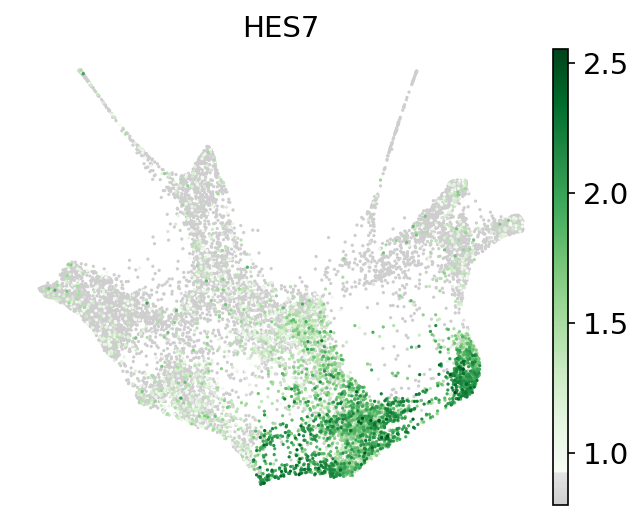

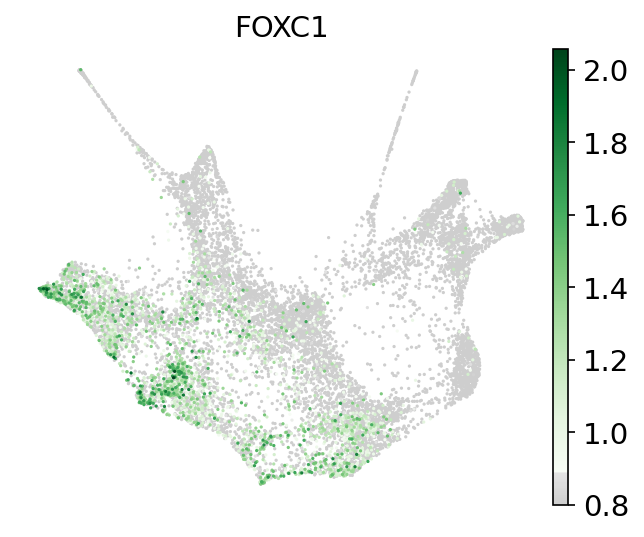

In [31]:
from matplotlib import colors
#Define a nice colour map for gene expression
colors2 = plt.cm.Greens(np.linspace(0, 1, 256))
colors3 = plt.cm.Greys_r(np.linspace(0.7,0.8,20))
colorsComb = np.vstack([colors3, colors2])
mymap = colors.LinearSegmentedColormap.from_list('my_colormap', colorsComb)
Endoderm=['APOA2']
Gastrula_Epiblast=['TDGF1']
Intermediate_mesoderm=['PAX8']
Lateral_plate_mesoderm=['HAND1']
NMP=['HES7']
Neural_ectoderm=['FEZ1','CDH1','POU5F1']
Praxial_mesoderm=['FOXC1']
Primitive_streak=['TSIX']
marker_all=Endoderm+Primitive_streak+Gastrula_Epiblast+Neural_ectoderm+Intermediate_mesoderm+Lateral_plate_mesoderm+NMP+Praxial_mesoderm
for gene in marker_all:
    fig,ax=plt.subplots(figsize=(5,4))
    sc.pl.draw_graph(adata1_filter_v1,color=gene,cmap=mymap,frameon=False,ax=ax,show=False,vmin=0.8)
    plt.savefig('/datb/home/wanglab13/PythonScripts/Cell_response/Paper_figures/human_gastrula_pcw3_gene_{}_v1.pdf'.format(gene),dpi=300, format='pdf')

In [56]:
adata1_filter_v1.write('./Data/human_gastrula_pcw3_three_germ_layers.h5ad')

# NMP regulated mesoderm and neural ectoderm development

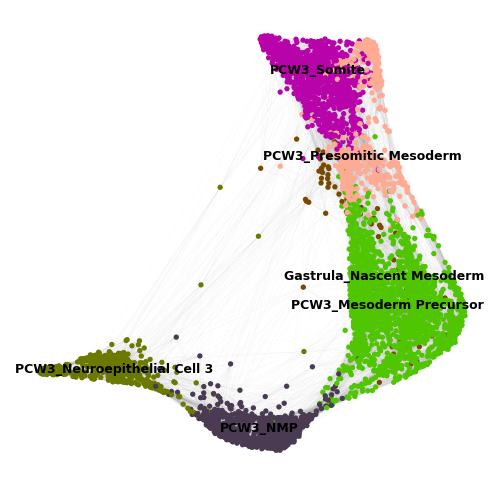

In [32]:
#fraction 1.0
adata1_eb_msd = adata1[adata1.obs['cluster_id_v1'].isin(['PCW3_NMP','Gastrula_Nascent Mesoderm','PCW3_Presomitic Mesoderm','PCW3_Neuroepithelial Cell 3', 'PCW3_Mesoderm Precursor','PCW3_Somite'])]
sc.pp.neighbors(adata1_eb_msd,n_neighbors=30)
sc.tl.draw_graph(adata1_eb_msd)
fig,ax=plt.subplots()
sc.pl.draw_graph(adata1_eb_msd,color='cluster_id_v1',legend_loc='on data',ax=ax,legend_fontsize=6,frameon=False,title='',edges=True, edges_width=0.01)

In [33]:
adata1_eb_msd_v1=sc.AnnData(X=adata1_rna[adata1_eb_msd.obs_names,].X,
                           obs=adata1_eb_msd.obs,
                          var=adata1_rna.var,
                          uns=adata1_eb_msd.uns,
                          obsm=adata1_eb_msd.obsm,
                          obsp=adata1_eb_msd.obsp)

In [34]:
map_coarse = {}
for c in adata1_eb_msd_v1.obs['cluster_id_v1'].cat.categories:
    if c in ['PCW3_NMP']:
        map_coarse[c]='NMP'
    if c in ['Gastrula_Nascent Mesoderm','PCW3_Mesoderm Precursor']:
        map_coarse[c]='MP'
    if c in ['PCW3_Presomitic Mesoderm']:
        map_coarse[c]='PSM'
    if c in ['PCW3_Somite']:
        map_coarse[c]='Somite'
    if c in ['PCW3_Neuroepithelial Cell 3']:
        map_coarse[c]='PNT'
adata1_eb_msd_v1.obs['clusters']=adata1_eb_msd_v1.obs['cluster_id_v1']
adata1_eb_msd_v1.obs.replace({'clusters':map_coarse},inplace=True)

... storing 'clusters' as categorical


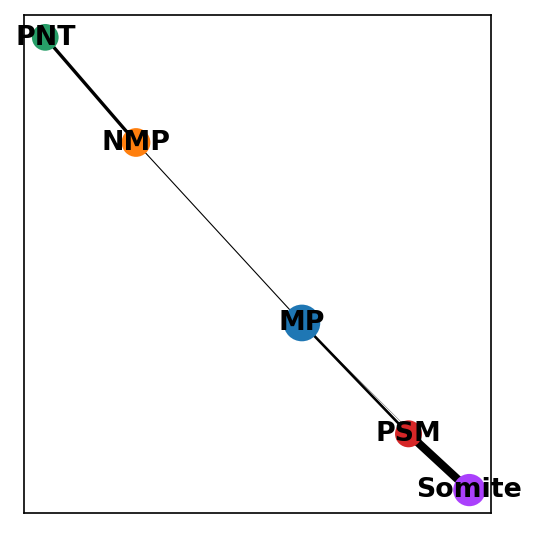

In [35]:
sc.tl.paga(adata1_eb_msd_v1,groups='clusters')
sc.pl.paga(adata1_eb_msd_v1)

In [36]:
adata1_eb_msd_v1.obs['clusters']=adata1_eb_msd_v1.obs['clusters'].astype('category')
adata1_eb_msd_v1.obs['clusters'].cat.reorder_categories(['PNT', 'NMP','MP',  'PSM', 'Somite'],inplace=True)
adata1_eb_msd_v1.uns['clusters_colors']=['#a6611a','#dfc27d','#b8e186','#80cdc1','#018571']

<AxesSubplot:xlabel='FA1', ylabel='FA2'>

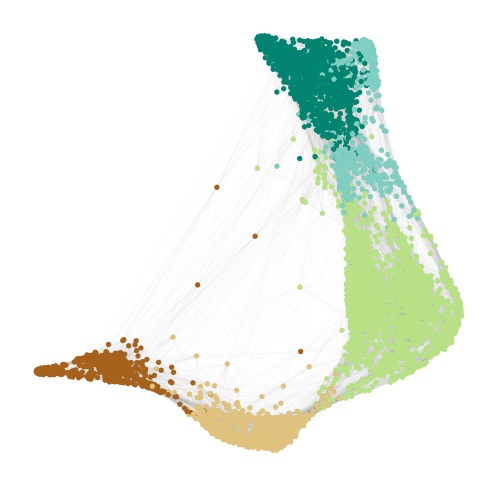

In [37]:
fig,ax=plt.subplots()
sc.pl.draw_graph(adata1_eb_msd_v1,color='clusters',legend_loc=None,ax=ax,legend_fontsize=6,frameon=False,title='',edges=True, edges_width=0.01,show=False)
# plt.savefig('./Paper_figures/NMP_Mesoderm_sp/NMP_regulate_v1.pdf', dpi=300, bbox_inches='tight') 

/datb/home/wanglab13/anaconda3/lib/python3.7/site-packages/scanpy/plotting/_tools/scatterplots.py:197: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = pl.figure()


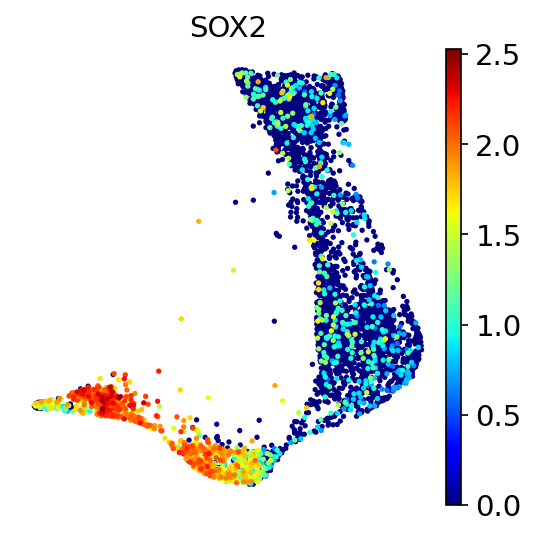

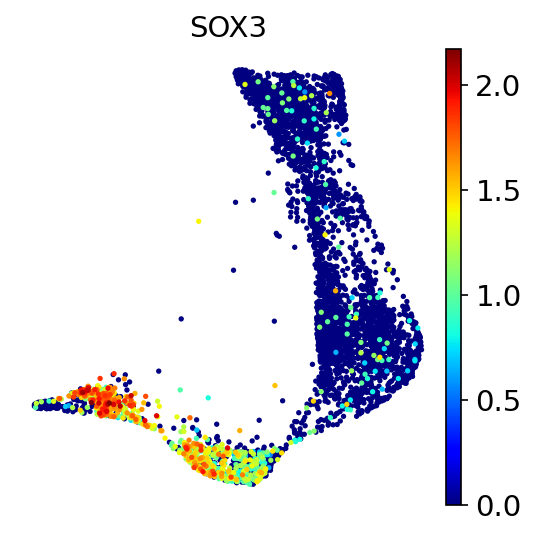

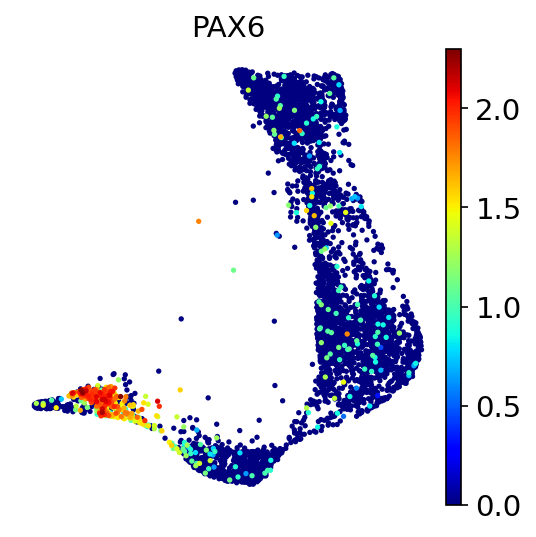

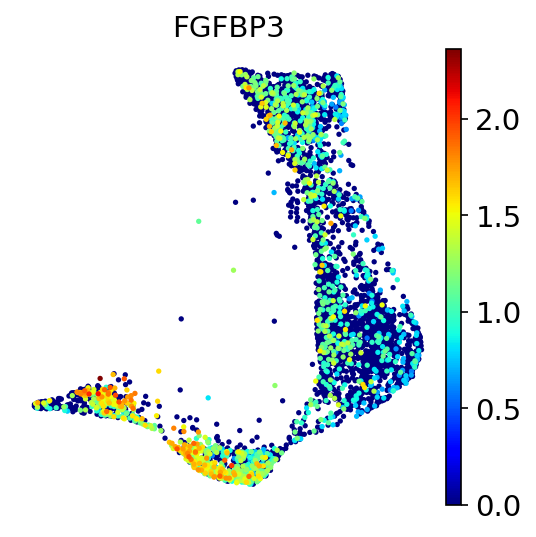

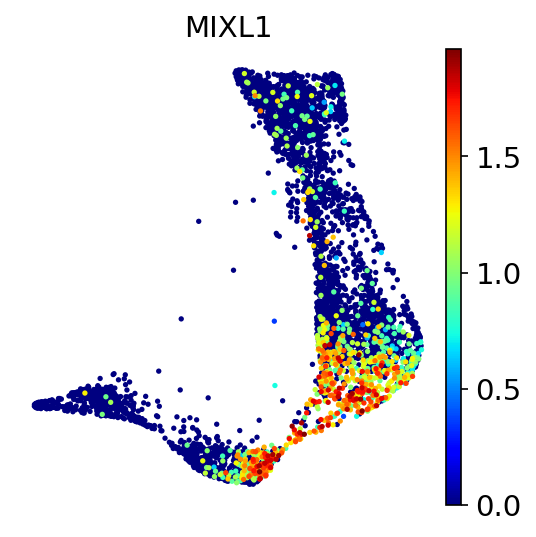

...

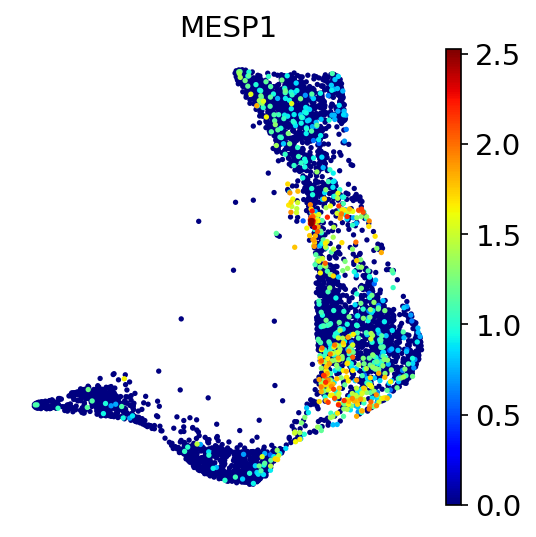

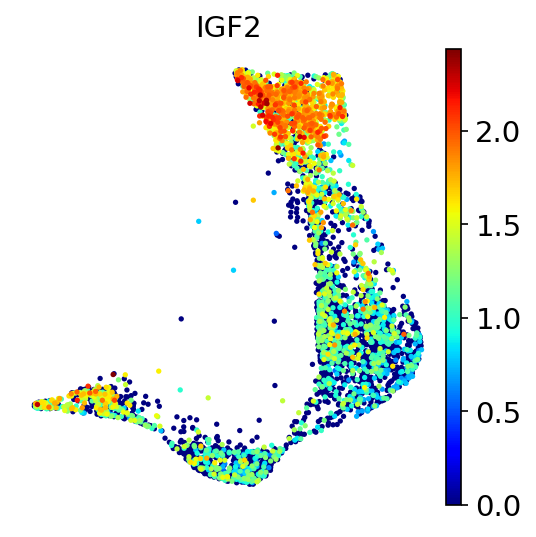

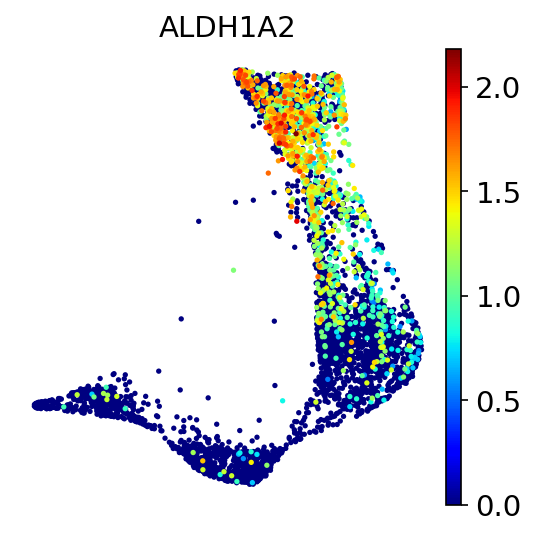

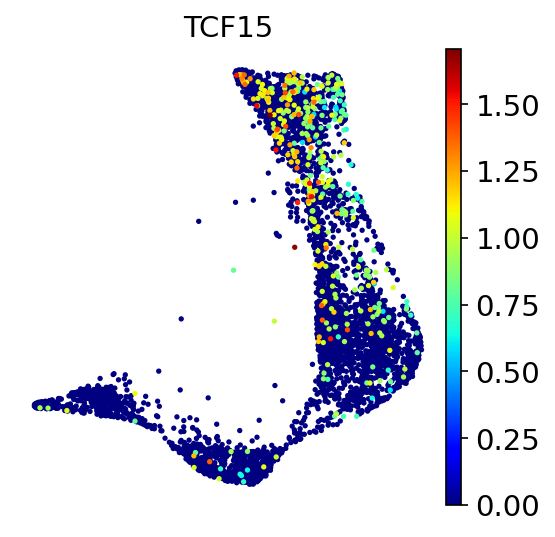

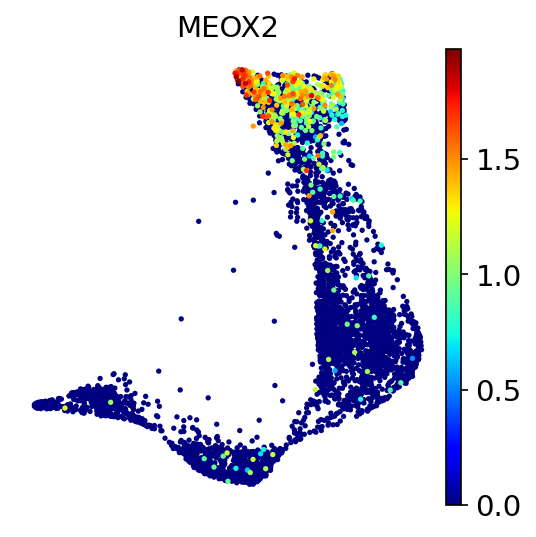

In [38]:
# Overlay gene expression values
genes=['SOX2','SOX3','PAX6','FGFBP3','MIXL1','HOXC9','CDX2','FGF8','FGF17','WNT3A','RSPO3','TBX6','DLL3','DKK1','CITED1','GBX2','FOXC1','RIPPLY2','FGF18','MEOX1','MESP2','MESP1','IGF2','ALDH1A2','TCF15','MEOX2']
for gn in genes:
    sc.pl.draw_graph(adata1_eb_msd_v1,  use_raw=False, color=[gn], edges=False, frameon=False, legend_loc='None',
                       cmap='jet', title=gn, show=False)
#     plt.savefig('./Paper_figures/NMP_Mesoderm_sp/{}.pdf'.format(gn), dpi=300, bbox_inches='tight') 

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


(-19477.539002436075,
 10162.663056999156,
 -16462.267854911282,
 18853.190579404683)

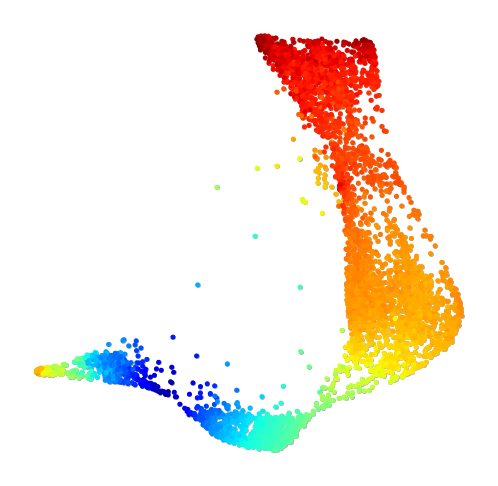

In [39]:
import matplotlib.pyplot as plt
# Calculate dpt pseudotime, starting from the NMP cluster
adata1_eb_msd_v1.uns['iroot'] = np.flatnonzero(adata1_eb_msd_v1.obs['clusters']  == 'NMP')[0]
sc.tl.diffmap(adata1_eb_msd_v1)
sc.tl.dpt(adata1_eb_msd_v1)

# Plot DPT values just for the NMP->SOM path
PMflag = adata1_eb_msd_v1.obs['clusters'].isin(['PNT', 'NMP','MP',  'PSM', 'Somite'])
fig,ax =plt.subplots(figsize=(4,4))
ax.scatter(adata1_eb_msd_v1.obsm['X_draw_graph_fa'][:,0], adata1_eb_msd_v1.obsm['X_draw_graph_fa'][:,1], c=[.7,.7,.7], s=2)
ax.scatter(adata1_eb_msd_v1.obsm['X_draw_graph_fa'][:,0][PMflag], adata1_eb_msd_v1.obsm['X_draw_graph_fa'][:,1][PMflag], 
           c=adata1_eb_msd_v1.obs['dpt_pseudotime'][PMflag], cmap='jet', s=2)
ax.set_xticks([]); ax.set_yticks([]);
ax.set_xlabel(''); ax.set_ylabel(''); ax.set_title('')
ax.axis('off')
# fig.savefig('./Paper_figures/NMP_Mesoderm_sp/NMP_Mesoderm_sp_pseudotime.pdf', bbox_inches='tight')

In [40]:
adata1_eb_msd_v2=sc.AnnData(X=adata1_eb_msd_v1.X.A,
                           obs=adata1_eb_msd_v1.obs,
                            var=adata1_eb_msd_v1.var,
                           uns=adata1_eb_msd_v1.uns,
                           obsm=adata1_eb_msd_v1.obsm,
                           obsp=adata1_eb_msd_v1.obsp)

/datb/home/wanglab13/anaconda3/lib/python3.7/site-packages/scanpy/plotting/_tools/paga.py:1177: UserWarning: FixedFormatter should only be used together with FixedLocator
  groups_axis.set_yticklabels(['', xlabel, ''], fontsize=ytick_fontsize)
/datb/home/wanglab13/anaconda3/lib/python3.7/site-packages/scanpy/plotting/_tools/paga.py:1220: UserWarning: FixedFormatter should only be used together with FixedLocator
  anno_axis.set_yticklabels(['', anno, ''], fontsize=ytick_fontsize)


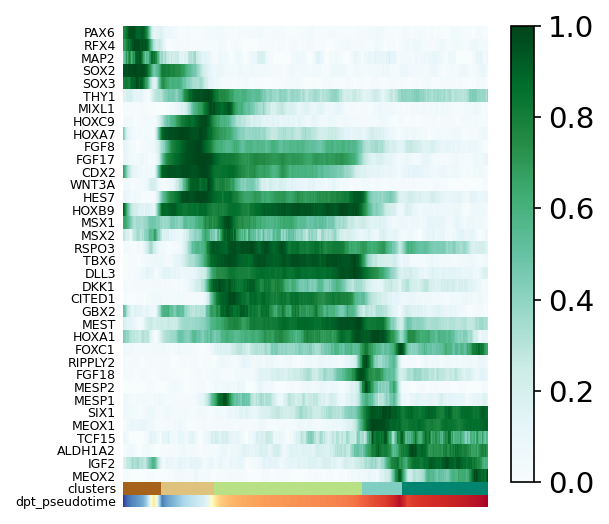

In [41]:
# Plot gene expression trajectories for select markers
traj_nodes = ['PNT', 'NMP','MP',  'PSM', 'Somite']
traj_genes = ['PAX6','RFX4','MAP2','SOX2','SOX3',
              'THY1','MIXL1','HOXC9','HOXA7','FGF8','FGF17','CDX2','WNT3A','HES7','HOXB9','MSX1','MSX2','RSPO3',
              'TBX6','DLL3','DKK1','CITED1','GBX2','MEST','HOXA1','FOXC1',
              'RIPPLY2','FGF18','MESP2','MESP1',
              'SIX1','MEOX1','TCF15','ALDH1A2','IGF2','MEOX2']

ax = sc.pl.paga_path(adata1_eb_msd_v2, nodes=traj_nodes, keys=traj_genes, use_raw=False, annotations=['dpt_pseudotime'],
                     color_map='BuGn', color_maps_annotations={'dpt_pseudotime': 'RdYlBu_r'}, palette_groups=None, 
                     n_avg=100, groups_key=None, xlim=[None, None], title=None, left_margin=None, ytick_fontsize=6, 
                     title_fontsize=None, show_node_names=False, show_yticks=True, show_colorbar=True, 
                     legend_fontsize=1, legend_fontweight=None, normalize_to_zero_one=True, as_heatmap=True, 
                     return_data=False, show=False, ax=None)
# plt.savefig('./Paper_figures/NMP_Mesoderm_sp/NMP_traj_heatmap_v3.pdf', dpi=300, bbox_inches='tight')

# Analysis of endoderm branch development from epiblast

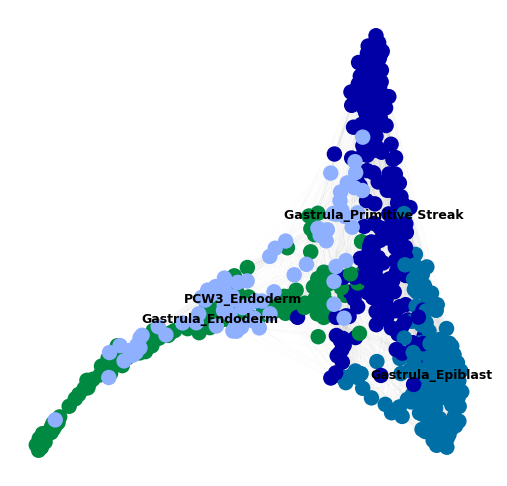

In [43]:
#fraction 1.0
adata1_eb_end = adata1_filter[adata1_filter.obs['cluster_id_v1'].isin(['Gastrula_Epiblast','Gastrula_Primitive Streak','Gastrula_Endoderm','PCW3_Endoderm'])]
sc.pp.neighbors(adata1_eb_end,n_neighbors=30)
sc.tl.draw_graph(adata1_eb_end)
fig,ax=plt.subplots()
sc.pl.draw_graph(adata1_eb_end,color='cluster_id_v1',legend_loc='on data',ax=ax,legend_fontsize=6,frameon=False,title='',edges=True, edges_width=0.01)

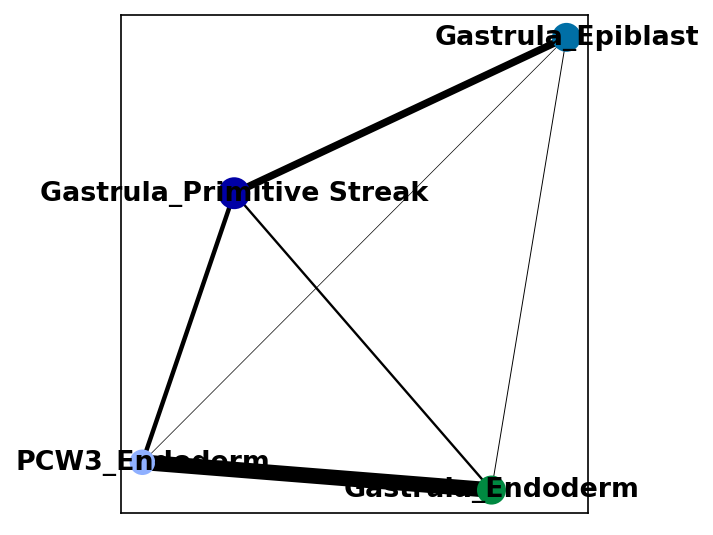

In [44]:
sc.tl.paga(adata1_eb_end,groups='cluster_id_v1')
sc.pl.paga(adata1_eb_end)

In [45]:
adata1_eb_end_v1=sc.AnnData(X=adata1_rna[adata1_eb_end.obs_names,].X,
                           obs=adata1_eb_end.obs,
                          var=adata1_rna.var,
                          uns=adata1_eb_end.uns,
                          obsm=adata1_eb_end.obsm,
                          obsp=adata1_eb_end.obsp)

In [46]:
map_coarse = {}
for c in adata1_eb_end_v1.obs['cluster_id_v1'].cat.categories:
    if c in ['Gastrula_Epiblast']:
        map_coarse[c]='Epiblast'
    if c in ['Gastrula_Primitive Streak']:
        map_coarse[c]='Primitive Streak'
    if c in ['Gastrula_Endoderm','PCW3_Endoderm']:
        map_coarse[c]='Endoderm'
adata1_eb_end_v1.obs['clusters']=adata1_eb_end_v1.obs['cluster_id_v1']
adata1_eb_end_v1.obs.replace({'clusters':map_coarse},inplace=True)

... storing 'clusters' as categorical


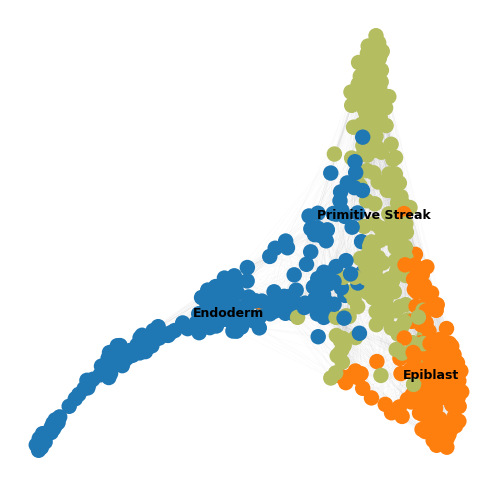

In [47]:
fig,ax=plt.subplots()
sc.pl.draw_graph(adata1_eb_end_v1,color='clusters',legend_loc='on data',ax=ax,legend_fontsize=6,frameon=False,title='',edges=True, edges_width=0.01)

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


(-7003.252659562966,
 2946.4430374424874,
 -1507.1845636848602,
 2128.9836060707476)

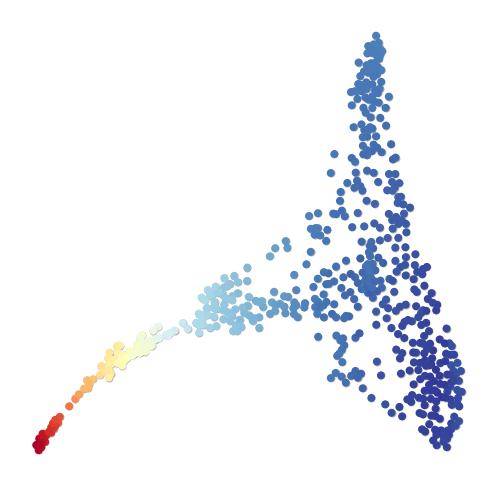

In [48]:
import matplotlib.pyplot as plt
# Calculate dpt pseudotime, starting from the NMP cluster
adata1_eb_end_v1.uns['iroot'] = np.flatnonzero(adata1_eb_end_v1.obs['clusters']  == 'Epiblast')[0]
sc.tl.diffmap(adata1_eb_end_v1)
sc.tl.dpt(adata1_eb_end_v1)

# Plot DPT values just for the NMP->SOM path
PMflag = adata1_eb_end_v1.obs['clusters'].isin(['Epiblast','Primitive Streak','Endoderm'])
fig,ax =plt.subplots(figsize=(4,4))
ax.scatter(adata1_eb_end_v1.obsm['X_draw_graph_fa'][:,0], adata1_eb_end_v1.obsm['X_draw_graph_fa'][:,1],  c=[.7,.7,.7], s=8)
ax.scatter(adata1_eb_end_v1.obsm['X_draw_graph_fa'][:,0][PMflag], adata1_eb_end_v1.obsm['X_draw_graph_fa'][:,1][PMflag], 
           c=adata1_eb_end_v1.obs['dpt_pseudotime'][PMflag], cmap='RdYlBu_r', s=8)
ax.set_xticks([]); ax.set_yticks([]);
ax.set_xlabel(''); ax.set_ylabel(''); ax.set_title('')
ax.axis('off')

In [54]:
import scipy
import matplotlib.pyplot as plt
from scipy.interpolate import UnivariateSpline
import numpy
data=scipy.sparse.csr_matrix.todense(adata1_eb_end_v1.X)

data=pd.DataFrame(data)

data.index=adata1_eb_end_v1.obs_names
data.columns=adata1_eb_end_v1.var_names

data['x']=adata1_eb_end_v1.obs['dpt_pseudotime']

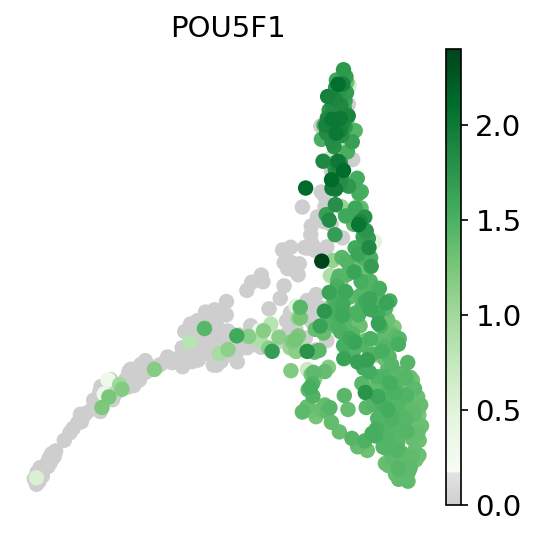

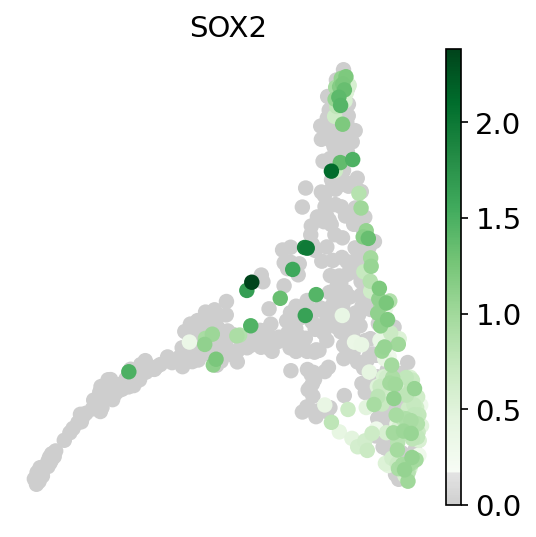

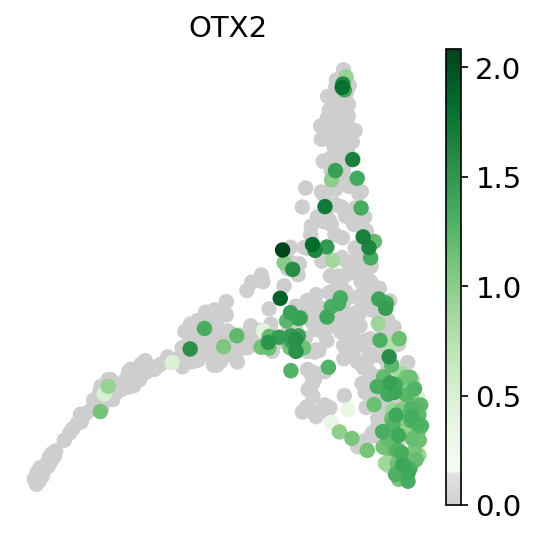

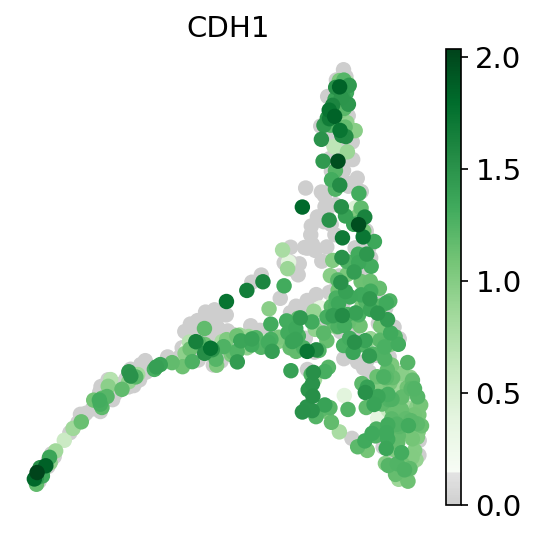

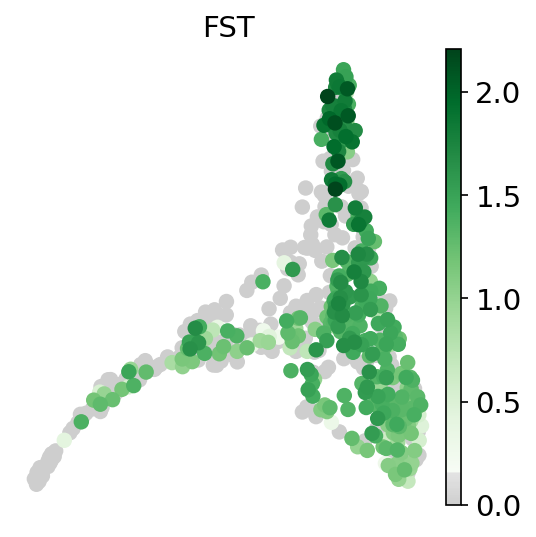

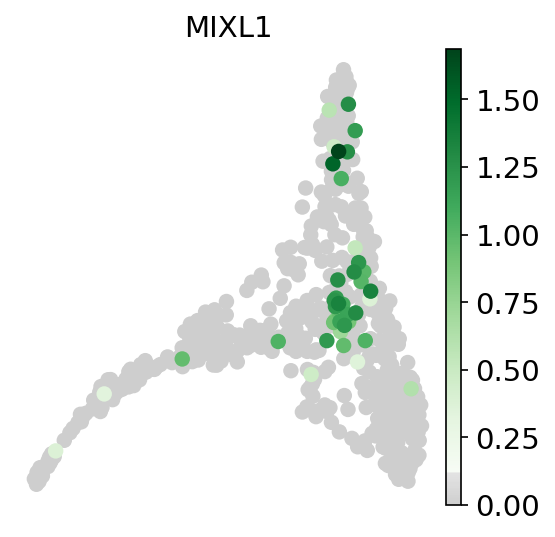

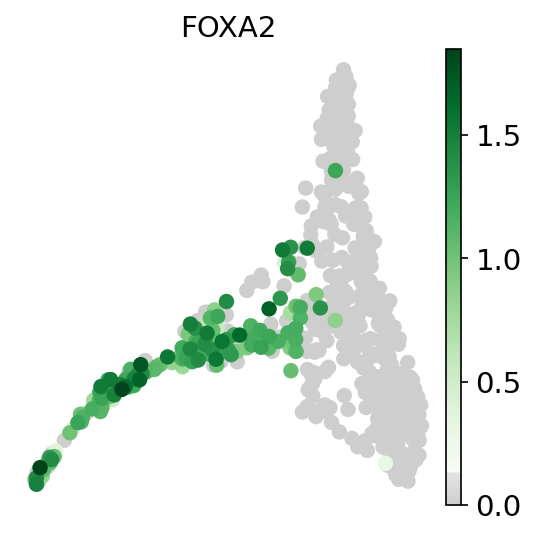

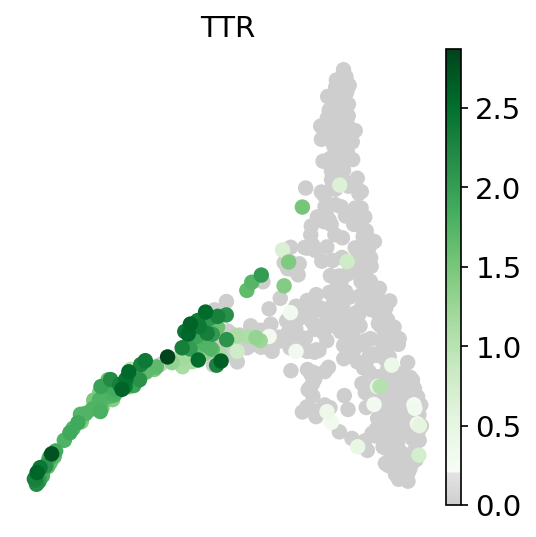

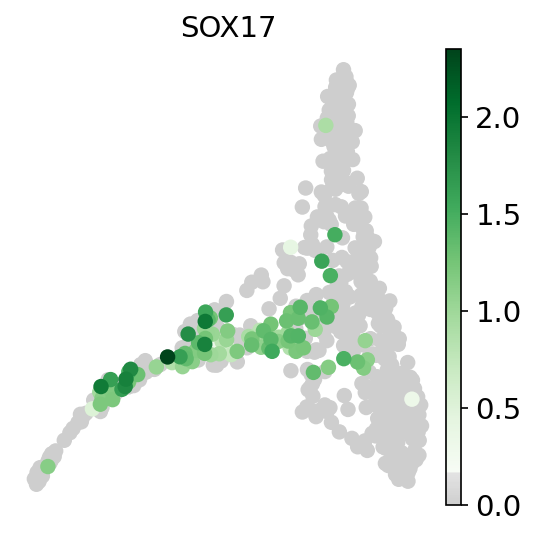

In [50]:
genes=['POU5F1','SOX2','OTX2','CDH1','FST','MIXL1','FOXA2','TTR','SOX17']
for gene in genes:
    fig,ax=plt.subplots()
    sc.pl.draw_graph(adata1_eb_end_v1,color=gene,cmap=mymap,frameon=False,ax=ax,show=False)
#     plt.savefig('./Paper_figures/Endoderm/Expression_{}.pdf'.format(gene),dpi=300,format='pdf')

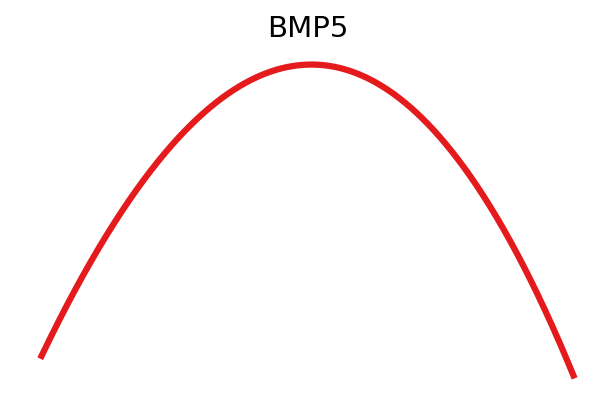

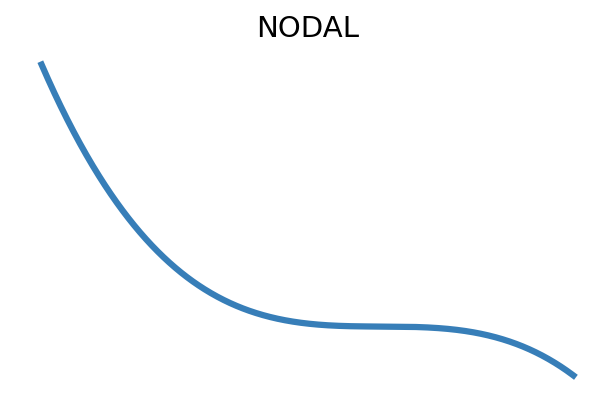

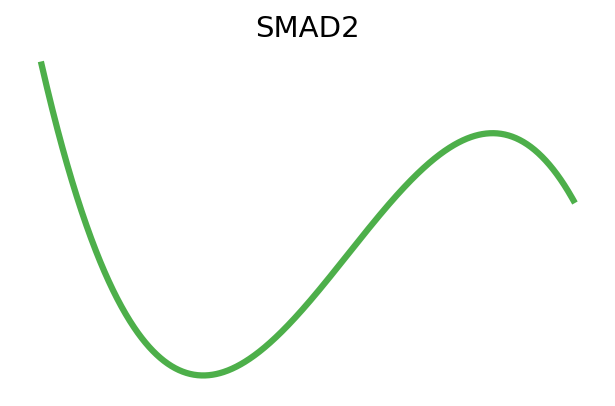

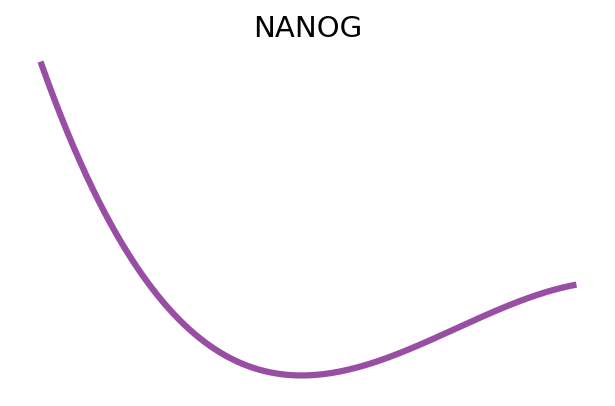

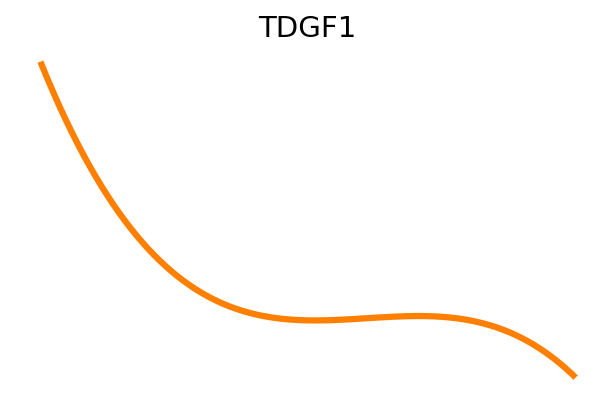

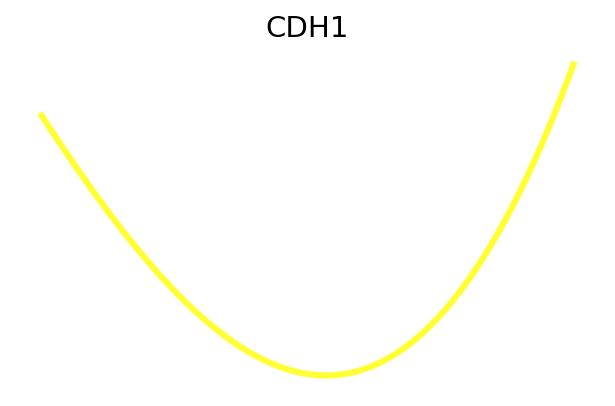

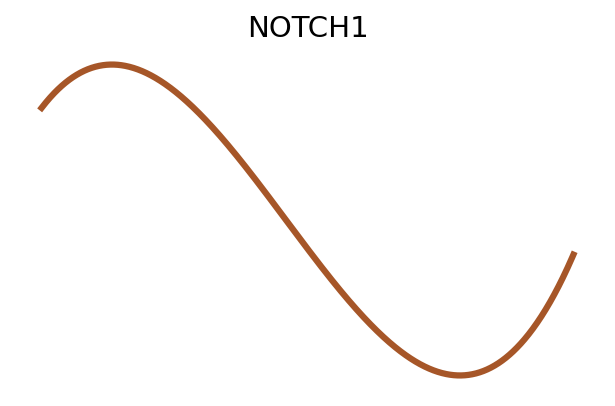

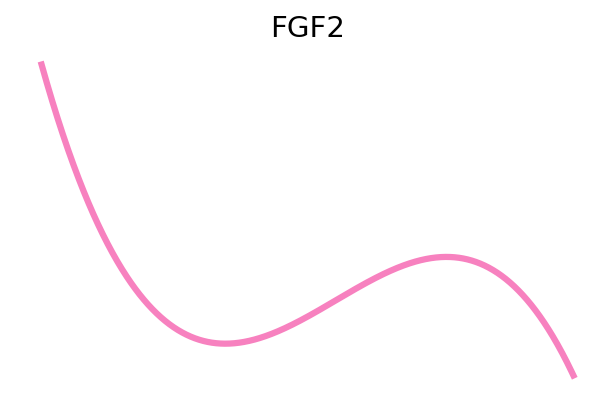

In [55]:
genes=['BMP5','NODAL','SMAD2','NANOG','TDGF1','CDH1','NOTCH1','FGF2']
gene_colors=['#e41a1c','#377eb8','#4daf4a','#984ea3','#ff7f00','#ffff33','#a65628','#f781bf']
for i,gene in enumerate(genes):
    x=data['x']
    y=data[gene]
    y=y[numpy.argsort(x)]
    x=sorted(x)
    spl = UnivariateSpline(x, y,k=3)
    xs = np.linspace(0, 1, 1000)
#     xs=x
    fig,ax=plt.subplots(figsize=(5,3))
    ax.plot(xs, spl(xs), gene_colors[i], lw=3)
    ax.axes.yaxis.set_visible(False)
    ax.axes.xaxis.set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.grid(False)
    plt.title(gene)